[<img src="https://gitlab.irit.fr/toc/etu-n7/controle-optimal/-/raw/master/ressources/inp-enseeiht.jpg" alt="N7" height="100"/>](https://gitlab.irit.fr/toc/etu-n7/controle-optimal)

- Nom : Oussakel
- Prénom : Rachida


# Transfert orbital en temps minimal

Ce sujet (ou TP-projet) est à rendre (voir la date sur moodle et les modalités du rendu) et sera évalué pour faire partie de la note finale de la matière Contrôle Optimal.

----

On considère le problème du transfert d'un satellite d'une orbite initiale à l'orbite géostationnaire à temps minimal. Ce problème s'écrit comme un problème de contrôle optimal sous la forme

$$
\left\lbrace
\begin{array}{l}
    \min J(x, u, t_f) = t_f \\[1.0em]
    \ \ \dot{x}_{1}(t) = ~ x_{3}(t)  \\[0.5em]
    \ \ \dot{x}_{2}(t) = ~ x_{4}(t)  \\[0.5em]
    \ \ \dot{x}_{3}(t) =  -\dfrac{\mu\, x_{1}(t)}{r^{3}(x(t))} + u_{1}(t)  \\[1em]
    \ \ \dot{x}_{4}(t) =  -\dfrac{\mu\, x_{2}(t)}{r^{3}(x(t))} + u_{2}(t), ~~ ||u(t)|| \leq \gamma_\mathrm{max}, ~~ t \in [0,t_f] ~~ \text{p.p.}, ~~ u(t) = (u_1(t),u_2(t)),  \\[1.5em]
    \ \ x_{1}(0)=x_{0,1}, ~~ x_{2}(0)=x_{0,2}, ~~ x_{3}(0)=x_{0,3}, ~~ x_{4}(0)=x_{0,4}, \\[1em]
    \ \ r(x(t_f)) = r_{f}, ~~ x_{3}(t_f)=-\sqrt{\dfrac{\mu}{r_{f}^{3}}}x_{2}(t_f), ~~ x_{4}           (t_f)= \sqrt{\dfrac{\mu}{r_{f}^{3}}}x_{1}(t_f), \\
\end{array}
\right.
$$

avec $r(x)=\sqrt{x_{1}^{2}+x_{2}^{2}}$.
Les unités choisies sont le kilomètre pour les distances et l'heure pour les  temps. On donne les paramètres suivants :
 
$$
\mu=5.1658620912 \times 10^{12} \ \mathrm{km}^{3}.\mathrm{h}^{-2}, \quad r_{f} = 42165 \ \mathrm{km}.
$$

Le paramètre $\gamma_\mathrm{max}$ dépend de la poussée maximale $F_\mathrm{max}$ suivant la relation :

$$
\gamma_\mathrm{max} = \frac{F_\mathrm{max}\times 3600^2}{m} 
$$

où m est la masse du satellite qu'on fixe à $m=2000\ \mathrm{kg}$.

## Résolution via du tir simple indirect

In [1]:
# Packages
# import Pkg; Pkg.add("DifferentialEquations")
# Pkg.add("Plots")
# Pkg.add("NLsolve")
# Pkg.add("ForwardDiff")
# Pkg.add("LinearAlgebra")
using  DifferentialEquations
using Plots
using ForwardDiff
using DualNumbers
using LinearAlgebra
using NLsolve

include("utils.jl"); # fonctions utilitaires

In [2]:
# Les constantes du pb
x0     = [-42272.67, 0, 0, -5796.72] # état initial
μ      = 5.1658620912*1e12
rf     = 42165
F_max  = 100
γ_max  = F_max*3600^2/(2000*10^3)
t0     = 0
rf3    = rf^3
α      = sqrt(μ/rf3);

✏️ **_Question 1:_**
    
1. Donner le pseudo-hamiltonien associé au problème de contrôle optimal.
$$
H = p1 * x3 + p2*x4 + p3*(-\dfrac{\mu\, x_{1}(t)}{r^{3}(x(t))} + u_{1}(t)) +p4*(-\dfrac{\mu\, x_{2}(t)}{r^{3}(x(t))} + u_{2}(t))
$$
2. Donner le pseudo système hamiltonien
$$
    \vec{H}(x, p, u) = \left(\frac{\partial H}{\partial p}(x, p, u), 
    -\frac{\partial H}{\partial x}(x, p, u) \right).
$$
$$
    \frac{\partial H}{\partial p}(x, p, u) = (x3,x4,-\dfrac{\mu\, x_{1}(t)}{r^{3}(x(t))} + u_{1}(t),-\dfrac{\mu\, x_{2}(t)}{r^{3}(x(t))} + u_{2}(t))
$$

$$
    -\frac{\partial H}{\partial x}(x, p, u) = (\dfrac{\mu*( r^{2}(x(t))-3x_{1}^2)}{r^{5}}*p3 -3*\dfrac{\mu *x_{2}*x_{1}}{r^5}*p4,\dfrac{\mu* (r^{2}(x(t))-3x_{2}^2)}{r^{5}}*p4 -3* p3 *\dfrac{\mu *x_{2}*x_{1}}{r^5} ,-p1,-p2)
$$

3. Calculer le contrôle maximisant. On supposera que $(p_3, p_4)\neq (0,0)$.

**Réponse** (double cliquer pour modifier le texte)

✏️ **_Question 2:_** Compléter le code suivant contenant le pseudo-hamiltonien, le pseudo système hamiltonien et le contrôle maximisant.

In [3]:
#####
##### A COMPLETER

# pseudo-Hamiltonien
function H(x, p, u)
    r3 = sqrt(x[1]^2+x[2]^2)^3
    h = p[1]*x[3]+p[2]*x[4]+p[3]*((-μ*x[1]/r3) +u[1])+p[4]*((-μ*x[2]/r3) +u[2])
    return h
end

# pseudo système hamiltonien
function Hv(x, p, u)
    n     = size(x, 1)
    r = sqrt(x[1]^2+x[2]^2)
    dp    = zeros(eltype(x), n)
    dp[1] = μ*((r^2 - 3*x[1]^2)*p[3]/r^5) -(3*p[4]*μ*x[2]*x[1]/r^5)
    dp[2] = μ*((r^2 - 3*x[2]^2)*p[4]/r^5) -(3*p[3]*μ*x[2]*x[1]/r^5)
    dp[3] = -p[1]
    dp[4] = -p[2]
    
    dx    = zeros(eltype(x), n)
    dx[1] = x[3]
    dx[2] = x[4]
    dx[3] = -(μ*x[1]/r^3) + u[1]
    dx[4] = -(μ*x[2]/r^3) + u[2]
    return dx, dp
end

#Contrôle maximisant
function control(p)
    u    = zeros(eltype(p),2)
    u[1] = p[3]* (γ_max/(sqrt(p[3]^2+p[4]^2)))
    u[2] = p[4]* (γ_max/(sqrt(p[3]^2+p[4]^2)))
    return u
end



#####
##### FIN A COMPLETER

# flot hamiltonien pour le calcul des extrémales
f = Flow((x, p) -> Hv(x, p, control(p)));

On note 
$
    \alpha := \sqrt{\frac{\mu}{r_f^3}}.
$
La condition terminale peut se mettre sous la forme $c(x(t_f)) = 0$, avec $c \colon \mathbb{R}^4 \to \mathbb{R}^3$.

✏️ **_Question 3:_** Donner l'expression de $c(x)$.
$$
c:(x_{1},x_{2},x_{3},x_{4}) -> (\sqrt{(x_{1}^2+x_{2}^2)}-r_{f},x_{3}+x_{2}*\sqrt{μ/r_{f}^3},x_{4}-x_{1}*\sqrt{μ/r_{f}^3})

$$

**Réponse** (double cliquer pour modifier le texte)

Le temps final étant libre, on a la condition au temps final 

$$
    H(x(t_f), p(t_f), u(t_f)) = -p^0 = 1. \quad \text{(on se place dans le cas normal)}
$$

De plus, la condition de transversalité 

$$
p(t_f) = c'(x(t_f))^T \lambda, ~~ \lambda \in \mathbb{R}^3,
$$

conduit à la relation suivante (où $\lambda$ n'apparaît plus)

$$
\Phi(x(t_f), p(t_f)) := x_2(t_f) \Big( p_1(t_f) + \alpha\, p_4(t_f) \Big) - x_1(t_f) \Big( p_2(t_f) - \alpha\, p_3(t_f) \Big) = 0.
$$

En considérant la condition aux limites, la condition finale sur le pseudo-hamiltonien et la condition de transversalité, la fonction de tir simple est donnée par 

\begin{equation*}
    \begin{array}{rlll}
        S \colon    & \mathbb{R}^5          & \longrightarrow   & \mathbb{R}^5 \\
        & (p_0, t_f)      & \longmapsto       &
        S(p_0, t_f) := \begin{pmatrix}
            c(x(t_f, x_0, p_0)) \\[0.5em]
            \Phi(z(t_f, x_0, p_0)) \\[0.5em]
            H(z(t_f, x_0, p_0), u(z(t_f, x_0, p_0))) - 1
        \end{pmatrix}
    \end{array}
\end{equation*}

où $z(t_f, x_0, p_0)$ est la solution au temps $t_f$ du pseudo système hamiltonien bouclé par
le contrôle maximisant, partant au temps $t_0=0$ du point $(x_0, p_0)$. On rappelle que l'on note
$z=(x, p)$.

✏️ **_Question 4:_** Compléter le code suivant de la fonction de tir.

In [8]:
#####
##### A COMPLETER

# Fonction de tir
function shoot(p0, tf)
    x, p = f(t0, x0, p0, tf)
    s = zeros(eltype(p0), 5)
    s[1] = sqrt(x[1]^2+x[2]^2)-rf
    s[2] = x[3] + x[2]*α
    s[3] = x[4] - x[1]*α
    s[4] = x[2]*(p[1]+ α*p[4]) - x[1]*(p[2]- α*p[3])
    s[5] = H(x, p, control(p)) -1
    
    return s

end;

✏️ **_Question 5:_** Expliquer simplement ce que fait le code suivant.

**Réponse** :  le code suivant effectue une résolution itérative des équations non linéaires en utilisant la méthode de tir pour trouver les valeurs optimales de p0 et tf qui satisfont les conditions de convergence définies par la fonction foo.

In [9]:
# Itéré initial
y_guess = [1.0323e-4, 4.915e-5, 3.568e-4, -1.554e-4, 13.4]   # pour F_max = 100N

# Jacobienne de la fonction de tir
foo(y)  = shoot(y[1:4], y[5])
jfoo(y) = ForwardDiff.jacobian(foo, y)

# Résolution de shoot(p0, tf) = 0
nl_sol = nlsolve(foo, jfoo, y_guess; xtol=1e-8, method=:trust_region, show_trace=true);

# On récupère la solution si convergence
if converged(nl_sol)
    p0_sol_100 = nl_sol.zero[1:4]
    tf_sol_100 = nl_sol.zero[5]
    println("\nFinal solution:\n", nl_sol.zero)
else
    error("Not converged")
end

Iter     f(x) inf-norm    Step 2-norm 
------   --------------   --------------


     0     4.208247e+02              NaN
     1     3.419791e+00     3.507495e-03
     2     8.493479e-02     3.222915e-04


     3     4.220110e-07     3.247983e-06
     4     7.275958e-11     2.965273e-10

Final solution:
[0.00010323118913618884, 4.892642781236174e-5, 0.0003567967293906548, -0.00015536138862860138, 13.403181957149323]


In [10]:
# Fonction d'affichage d'une solution
function plot_solution(p0, tf)

    # On trace l'orbite de départ et d'arrivée
    gr(dpi=300, size=(500,400), thickness_scaling=1)
    r0        = norm(x0[1:2])
    v0        = norm(x0[3:4])
    a         = 1.0/(2.0/r0-v0*v0/μ)
    t1        = r0*v0*v0/μ - 1.0;
    t2        = (x0[1:2]'*x0[3:4])/sqrt(a*μ);
    e_ellipse = norm([t1 t2])
    p_orb     = a*(1-e_ellipse^2);
    n_theta   = 101
    Theta     = range(0, stop=2*pi, length=n_theta)
    X1_orb_init = zeros(n_theta)
    X2_orb_init = zeros(n_theta)
    X1_orb_arr  = zeros(n_theta)
    X2_orb_arr  = zeros(n_theta)

    # Orbite initiale
    for  i in 1:n_theta
        theta = Theta[i]
        r_orb = p_orb/(1+e_ellipse*cos(theta));
        X1_orb_init[i] = r_orb*cos(theta);
        X2_orb_init[i] = r_orb*sin(theta);
    end

    # Orbite d'arrivée
    for  i in 1:n_theta
        theta = Theta[i]
        X1_orb_arr[i] = rf*cos(theta) ;
        X2_orb_arr[i] = rf*sin(theta);
    end;

    # Calcul de la trajectoire
    ode_sol  = f((t0, tf), x0, p0)
    t  = ode_sol.t
    x1 = [ode_sol[1, j] for j in 1:size(t, 1) ]
    x2 = [ode_sol[2, j] for j in 1:size(t, 1) ]
    u  = zeros(2, length(t))

    for j in 1:size(t, 1)
        u[:,j] = control(ode_sol[5:8, j])
    end

    px = plot(x1, x2, color=:red, legend=:best, label="Trajectoire",
        border=:none, size = (800,400), aspect_ratio=:equal)
    plot!(px, X1_orb_init, X2_orb_init, color=:green, label="Orbite initiale")
    plot!(px, X1_orb_arr, X2_orb_arr, color=:blue, label="Orbite d'arrivée")
    plot!(px, [x0[1]], [x0[2]], seriestype=:scatter, color=:green, markersize = 5, label="Départ")
    xf = ode_sol[1:2, end]
    plot!(px, [xf[1]], [xf[2]], seriestype=:scatter, color=:red, markersize = 5, label="Arrivée")
    plot!(px, [0.0], [0.0], color = :blue, seriestype=:scatter, markersize = 25, label="Terre")

    pu1 = plot(t, u[1,:], color=:red, label="u₁(t)", legend=:best)
    pu2 = plot(t, u[2,:], color=:red, label="u₂(t)", legend=:best)

    display(plot(pu1, pu2, layout = (1,2), size = (800,400)))
    display(px)
    
end;

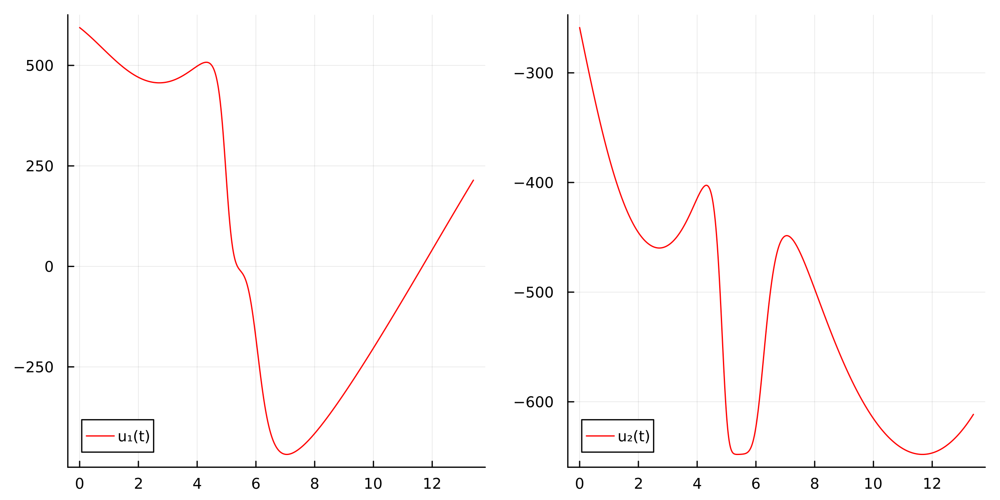

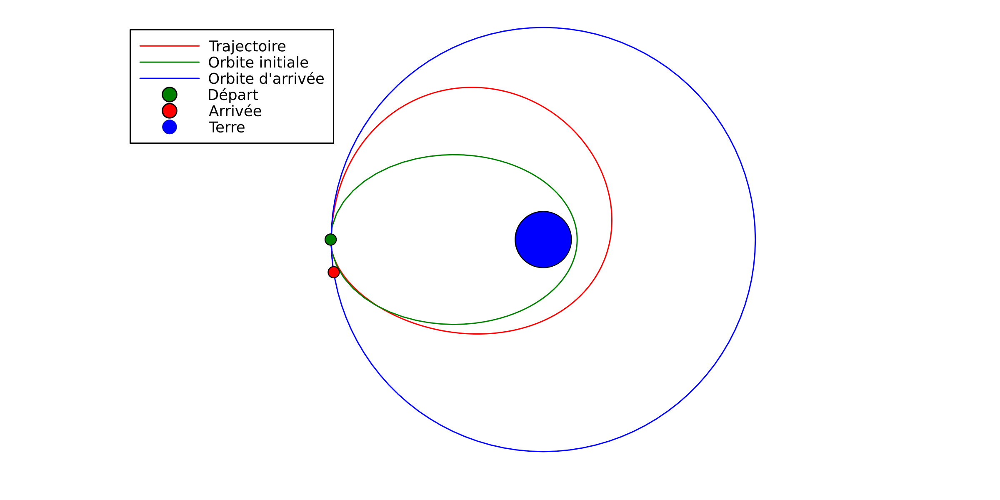

13.403181957149323[0.00010323118913618884, 4.892642781236174e-5, 0.0003567967293906548, -0.00015536138862860138]

In [12]:
# On affiche la solution pour Fmax = 100
plot_solution(p0_sol_100, tf_sol_100)
print(tf_sol_100)
print(p0_sol_100)

✏️ **_Question 6:_** Que vaut le temps final $t_f$ (à 5 digits près) ? Combien de révolutions complètes autour de la Terre a réalisé le satellite.


**Réponse** :
$$
tf = 13.40318
$$
D'après le graphique, il est clair que le satellite a effectué une révolution complète autour de la Terre, comme indiqué par la courbe rouge.


In [8]:
#  période de révolution du satellite :
# Tsat= 2*pi*sqrt(rf3/μ)
# print(tf_sol_100/Tsat)

0.5599784216416267

# Etude du temps de transfert en fonction de la poussée maximale

✏️ **_Question 7:_** 

* A l'aide de ce que vous avez fait précédemment, déterminer $t_f$ (attention, penser à bien itinialiser la
méthode de tir) pour
    
$$
    F_\mathrm{max} \in \{100, 90, 80, 70, 60, 50, 40, 30, 20 \}.
$$
    
* Tracer ensuite $t_f$ en fonction de $F_\mathrm{max}$ et commenter le résultat.

**Réponse** (double cliquer pour modifier le texte et donner votre commentaire)

In [13]:
# Les différentes valeurs de poussées
F_max_span = range(100, stop=20, length=11);
γ_max_span = [F_max_span[j]*3600^2/(2000*10^3) for j in 1:size(F_max_span,1)];

In [15]:
# Solution calculée précédemment
y_guess = [p0_sol_100; [tf_sol_100]]

# Pour le stockage des solutions
tf_sols = zeros(length(γ_max_span))     # vecteur des temps de transfert
p0_sols = zeros(4, length(γ_max_span))  # matrice des co-états initiaux

#####
##### A COMPLETER
for i in 1:length(γ_max_span)
    γ_max = γ_max_span[i];
    
    # Jacobienne de la fonction de tir
    foo(y)  = shoot(y[1:4], y[5])
    jfoo(y) = ForwardDiff.jacobian(foo, y)

    nl_sol = nlsolve(foo, jfoo, y_guess; xtol=1e-8, method=:trust_region, show_trace=true);

    # On récupère la solution si convergence
    if converged(nl_sol)
        tf_sol = nl_sol.zero[5]
        tf_sols[i] = tf_sol
        p0_sol = nl_sol.zero[1:4]
        p0_sols[:,i] = p0_sol
        y_guess = [p0_sol; [tf_sol]]
        println("\nFinal solution:\n", nl_sol.zero)
    else
        error("Not converged")
    end
end




Iter     f(x) inf-norm    Step 2-norm 


------   --------------   --------------

Final solution:
[0.00010323118913618884, 4.892642781236174e-5, 0.0003567967293906548, -0.00015536138862860138, 13.403181957149323]
Iter     f(x) inf-norm    Step 2-norm 


------   --------------   --------------
     0     4.838808e+02              NaN
     1     4.453296e+02     4.196162e-01
     2     7.423952e+00     2.248534e-02


     3     2.765054e-01     2.855708e-03


     4     4.593358e-06     1.509751e-05
     5     8.512870e-10     2.229389e-09

Final solution:
[8.581713189737029e-5, 4.8234340172800084e-5, 0.00035174966960543034, -0.0002655600836094159, 13.842412694293015]
Iter     f(x) inf-norm    Step 2-norm 


------   --------------   --------------
     0     5.679920e+02              NaN
     1     8.759384e+02     5.421011e-20
     2     8.759384e+02     0.000000e+00
     3     8.759384e+02     0.000000e+00
     4     3.447609e+02     3.716917e-01
     5     2.033600e+02     1.871190e-01


     6     4.413849e+00     1.277062e-02
     7     6.276731e-03     3.397455e-04
     8     1.315493e-08     2.254586e-07


     9     2.910383e-10     2.220475e-13

Final solution:
[4.701018657472676e-5, 4.453506776935763e-5, 0.00032477266855123816, -0.0004884780851598321, 14.388112730599115]


Iter     f(x) inf-norm    Step 2-norm 
------   --------------   --------------
     0     6.046224e+02              NaN
     1     1.233158e+03     1.084202e-19


     2     9.434322e+02     0.000000e+00
     3     4.396926e+02     3.747128e-01
     4     5.060527e+02     4.395745e-01
     5     7.219486e+01     3.660911e-02
     6     2.941030e+00     2.767070e-03


     7     3.590857e-03     9.481574e-05
     8     3.892637e-09     1.205495e-07

Final solution:
[-8.975846492585464e-5, 2.5783072334817542e-5, 0.0001880234526418987,

 -0.001215876621554267, 15.168652689912886]
Iter     f(x) inf-norm    Step 2-norm 
------   --------------   --------------


     0     8.016709e+02              NaN
     1     4.717266e+02     5.643395e-01


     2     2.435188e+02     1.089348e+00
     3     8.715814e+00     3.546884e-02
     4     1.684928e-02     6.313422e-04


     5     6.111077e-08     6.065766e-06


     6     6.839400e-10     4.730474e-11

Final solution:
[-0.0005358485722273614, -3.7737728264722346e-5, -0.00027520296538169835, -0.003567859666253238, 16.7875078550544]
Iter     f(x) inf-norm    Step 2-norm 


------   --------------   --------------
     0     3.141310e+03              NaN
     1     1.041191e+03     1.010728e+00
     2     6.608152e+03     6.776264e-21
     3     2.647823e+03     1.776357e-15


     4     1.179024e+03     8.102613e-01
     5     5.249715e+03     0.000000e+00


     6     6.852331e+02     1.795692e+00
     7     1.809593e+02     9.871038e-01


     8     9.909561e+00     1.705695e-01
     9     5.380537e-02     7.899354e-03
    10     1.433073e-07     3.910234e-06
    11     1.709850e-09     2.088783e-10

Final solution:
[-0.0005721785006618002, -3.2274637227392e-5, -0.00023536328973785514, -0.0038335986907857924, 19.54830389394114]
Iter     f(x) inf-norm    Step 2-norm 


------   --------------   --------------
     0     7.357110e+03              NaN


     1     5.305943e+03     2.206149e+00
     2     4.055753e+03     1.044846e+00
     3     9.762465e+02     2.522606e+00
     4     1.030526e+03     6.776264e-21


     5     1.030526e+03     0.000000e+00
     6     8.601662e+02     7.199335e-01


     7     1.052148e+02     2.168873e-01
     8     8.949811e-02     1.237612e-02
     9     2.726608e-04     2.876843e-04


    10     3.055902e-09     1.279624e-08

Final solution:
[-0.0004898952365456577, -1.0804071086084734e-5, -7.878885502239282e-5, -0.0034568939157117863, 22.741836800576632]
Iter     f(x) inf-norm    Step 2-norm 


------   --------------   --------------
     0     1.137391e+04              NaN
     1     6.809020e+03     3.675742e-01
     2     1.992712e+04     6.776264e-21


     3     1.632438e+04     0.000000e+00
     4     1.029183e+04     2.168404e-19


     5     5.624957e+03     3.678886e-01
     6     1.117272e+04     2.172635e-19
     7     8.946070e+03     2.168404e-19
     8     4.974167e+03     2.172635e-19


     9     4.953318e+03     1.428054e-01
    10     5.878266e+03     0.000000e+00


    11     4.402482e+03     0.000000e+00
    12     3.231641e+03     2.012281e-01


    13     2.207673e+03     1.559569e-01


    14     2.173316e+03     3.515549e-01
    15     1.275465e+03     2.220890e+00
    16     3.884459e+02     2.332886e+00


    17     2.386875e+02     1.010295e-02
    18     5.662329e+00     8.989698e-02


    19     6.088340e-03     1.945577e-03
    20     2.673187e-08     2.859527e-06


    21     3.034074e-09     9.642065e-12

Final solution:
[-0.00012881729648272055, 2.805980107798046e-5, 0.00020462653211507424, -0.001992582704941685, 28.22467983020142]
Iter     f(x) inf-norm    Step 2-norm 
------   --------------   --------------


     0     4.170239e+03              NaN
     1     1.285366e+03     3.291350e+00


     2     1.619069e+02     1.071966e+00


     3     5.477050e+01     1.180438e-01
     4     3.413177e+01     7.165999e-03


     5     3.284048e-01     2.008014e-02


     6     4.968754e-05     1.395528e-04
     7     1.491571e-10     3.643531e-08

Final solution:
[-0.0005018309458711215, 6.028020714565427e-6, 4.3959434028805853e-5, -0.0038914836937972543, 32.49705774620023]
Iter     f(x) inf-norm    Step 2-norm 
------   --------------   --------------


     0     2.307840e+03              NaN
     1     9.657377e+03     1.084235e-19
     2     1.017534e+04     0.000000e+00
     3     7.323790e+03     4.336809e-19
     4     3.900831e+03     4.337338e-19


     5     2.073137e+03     4.972846e-01
     6     2.598216e+03     0.000000e+00


     7     1.729607e+03     4.060654e-01


     8     1.650183e+03     4.942710e-01
     9     1.601429e+03     3.344948e-01
    10     1.525215e+03     2.522997e-01


    11     1.515033e+03     5.782304e-02
    12     1.503112e+03     9.863747e-02


    13     1.514058e+03     2.010273e-01
    14     1.536150e+03     2.374338e-01
    15     1.545559e+03     4.345271e-19


    16     1.526574e+03     8.759890e-02
    17     1.522804e+03     6.702624e-02


    18     1.516762e+03     5.039938e-02
    19     1.511446e+03     9.495651e-02
    20     1.465761e+03     1.734723e-18
    21     1.476736e+03     0.000000e+00
    22     1.484198e+03     2.775579e-17


    23     1.488749e+03     2.486680e-01


    24     1.517307e+03     2.586529e-02
    25     1.514568e+03     8.044256e-02
    26     1.571604e+03     0.000000e+00
    27     1.517498e+03     1.097506e-01


    28     1.908338e+03     0.000000e+00
    29     1.536583e+03     0.000000e+00


    30     1.514440e+03     9.401600e-02
    31     1.568211e+03     0.000000e+00
    32     1.515843e+03     1.386624e-01
    33     1.724631e+03     0.000000e+00


    34     1.528668e+03     2.185610e-01
    35     1.503792e+03     1.652854e-01


    36     2.855963e+04     0.000000e+00
    37     1.102918e+04     6.938894e-18
    38     7.540044e+03     1.355253e-20
    39     3.346327e+03     1.355253e-20
    40     1.443494e+03     0.000000e+00


    41     1.480163e+03     8.789414e-01
    42     1.442703e+03     7.944728e-02


    43     1.447414e+03     9.158810e-02
    44     1.418254e+03     1.853966e-01


    45     1.406708e+03     3.934594e-01
    46     1.315694e+03     6.776264e-21
    47     1.308026e+03     5.774888e-01


    48     2.521412e+03     0.000000e+00
    49     1.175568e+03     7.747983e-01


    50     1.141820e+04     0.000000e+00
    51     8.236639e+02     1.254330e+00
    52     2.951442e+03     0.000000e+00
    53     2.951442e+03     0.000000e+00
    54     3.555199e+03     0.000000e+00


    55     5.868800e+02     9.111960e-01
    56     2.053372e+02     2.141484e+00


    57     3.290169e+01     4.112771e-01


    58     9.985479e-01     4.799205e-02
    59     2.978993e-05     1.606756e-04
    60     2.131856e-09     6.313377e-08

Final solution:
[-0.0011246695138689012, -1.3113905314688702e-5, -9.563335675965083e-5, -0.0066155053952480294, 42.608560023931915]
Iter     f(x) inf-norm    Step 2-norm 
------   --------------   --------------


     0     8.001143e+03              NaN


     1     6.690213e+03     1.132899e+01
     2     3.047809e+03     1.240515e+00


     3     3.125390e+03     4.470280e-19


     4     1.932248e+03     1.142548e-01
     5     8.219692e+02     9.814454e-01


     6     1.295103e+04     0.000000e+00
     7     8.498190e+03     0.000000e+00


     8     1.013878e+03     0.000000e+00
     9     9.276720e+02     1.368373e-01
    10     8.625958e+02     0.000000e+00


    11     8.360045e+02     6.726541e-01
    12     1.152809e+03     0.000000e+00


    13     7.639985e+02     7.002054e-01
    14     1.403536e+03     0.000000e+00
    15     1.111937e+03     6.776264e-21


    16     6.600471e+02     4.949750e-01
    17     9.915815e+02     0.000000e+00
    18     5.720972e+02     0.000000e+00


    19     6.123405e+02     2.441989e-01
    20     5.394079e+02     0.000000e+00


    21     4.940433e+02     2.105761e+00
    22     5.834744e+02     1.355253e-20
    23     5.834744e+02     0.000000e+00


    24     2.945032e+02     6.161267e-01


    25     4.482913e+01     3.850842e-01


    26     4.802098e+01     3.955506e-01


    27     1.882023e-01     2.132056e-02
    28     3.405745e-06     5.973126e-05
    29     2.700835e-08     5.706271e-09

Final solution:
[-0.001361571112437408, -7.349896979826957e-6, -5.3599237082513946e-5, -0.008582713096396074, 59.855166890321456]


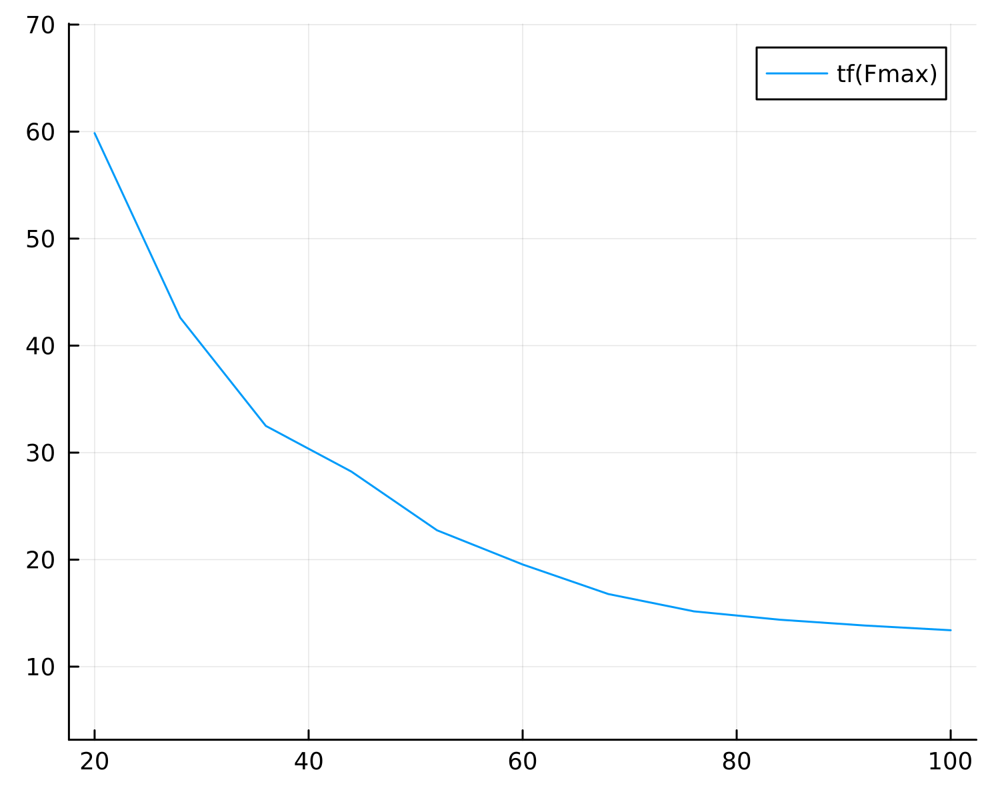

In [16]:
# Affichage de tf en fonction de la poussée maximale
plot(F_max_span, tf_sols, aspect_ratio=:equal, legend=:best, label="tf(Fmax)")

Commentaire : d'après le tracé, on voit que le temps tf décroit en fonction de la poussée maximale

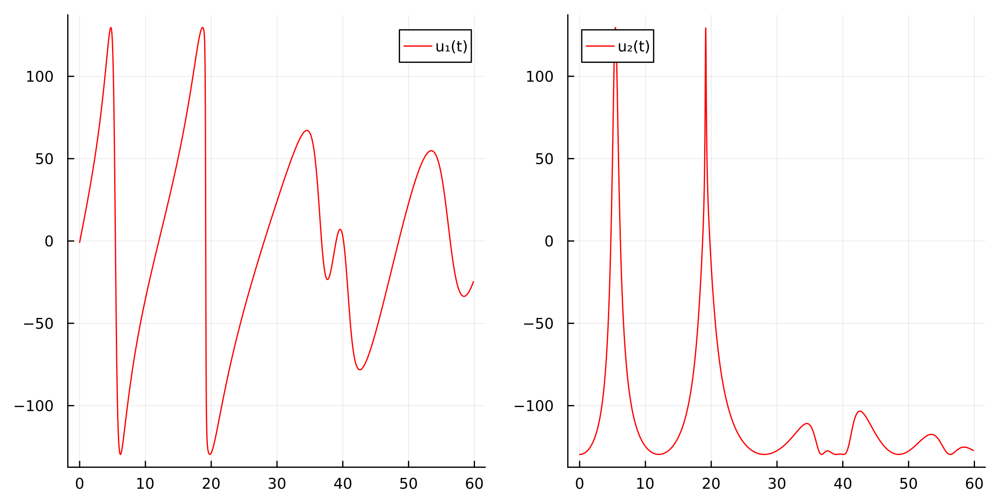

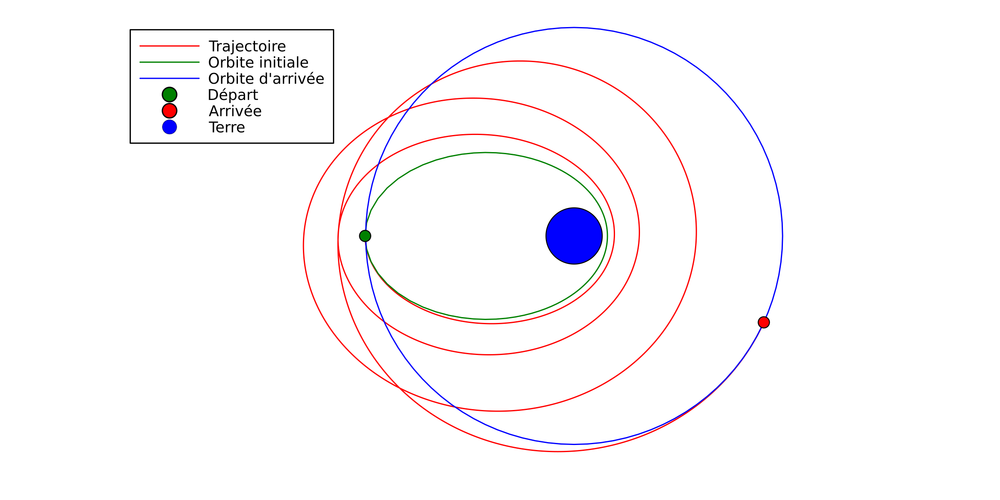

In [17]:
# Plots sol pour F_max = 20N
i = 11
γ_max = γ_max_span[i]
plot_solution(p0_sols[:, i], tf_sols[i])

# Animation

Juste pour s'amuser

In [18]:
include("space.jl"); using .Space

Fps     = 3
NFrame  = 100
Vitesse = 0.3684871655899519
Durée totale de la mission = 90.45995748580906 h


┌ Info: Saved animation to c:\Users\rachi\Downloads\transfert-temps-min.gif
└ @ Plots C:\Users\rachi\.julia\packages\Plots\Pn7Zn\src\animation.jl:149


Plots.AnimatedGif("c:\\Users\\rachi\\Downloads\\transfert-temps-min.gif")
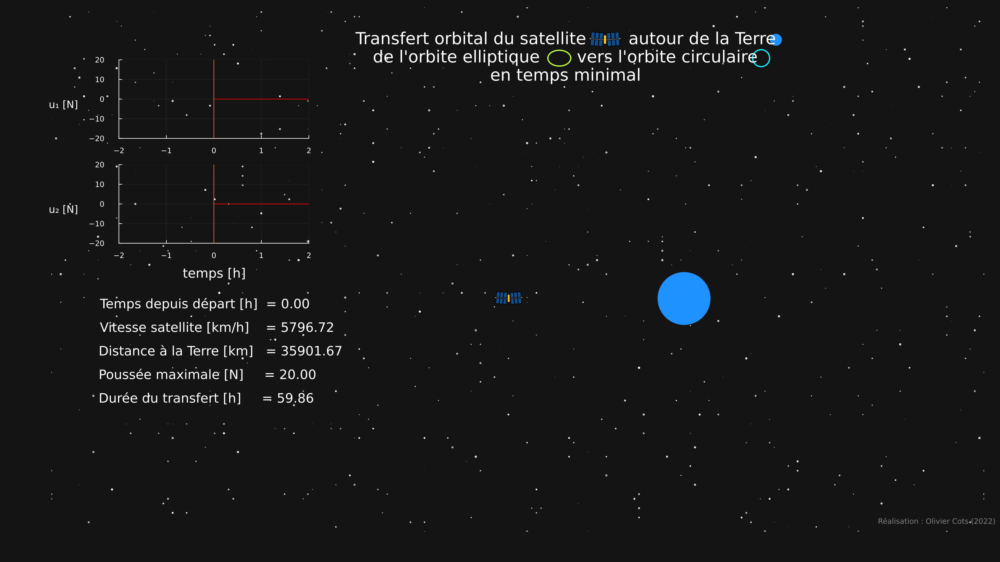

In [19]:
# solution choice
i = 11
γ_max = γ_max_span[i] # γ_max must be updated for the use of the flow

# animation
# nFrame = 100; d = 30; fps = floor(Int, nFrame/d) => 2 minutes and 30 seconds of computation
nFrame = 100; d = 30; fps = floor(Int, nFrame/d)
Space.animation(p0_sols[:, i], tf_sols[i], f, γ_max, nFrame=nFrame, fps=fps)